<div style="padding:20px;color:white;margin:0;font-size:175%;text-align:center;display:fill;border-radius:5px;background-color:#016CC9;overflow:hidden;font-weight:500">ADULT CENSUS INCOME</div>

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>1 | Introduction</div></b>
A census is the procedure of systematically acquiring and recording information about the members of a given population.
The census is a special, wide-range activity, which takes place once a decade in the entire country. The purpose is to gather information about the general population, in order to present a full and reliable picture of the population in the country - its housing conditions and demographic, social and economic characteristics. The information collected includes data on age, gender, country of origin, marital status, housing conditions, marriage, education, employment, etc.

### <b><span style='color:#DEB078'>1.1 |</span><span style='color:#016CC9'> Data description </span></b> 
This data was extracted from the 1994 Census bureau database by Ronny Kohavi and Barry Becker (Data Mining and Visualization, Silicon Graphics).  The prediction task is to determine whether a person makes over $50K a year.

### <b><span style='color:#DEB078'>1.2 |</span><span style='color:#016CC9'> Features Description </span></b>  
**1. Categorical Attributes**
 * **workclass**:  Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.
  -  Individual work category  
 * **education**: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.
  -  Individual's highest education degree  
 * **marital-status**: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
  -  Individual marital status  
 * **occupation**:  Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
  -  Individual's occupation  
 * **relationship**:  Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.
  -  Individual's relation in a family   
 * **race**:  White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.
  -  Race of Individual   
 * **sex**:  Female, Male.
 * **native-country**:  United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.
  -  Individual's native country   
  
**2. Continuous Attributes**
 * **age**: continuous.
  -  Age of an individual  
 * **fnlwgt**: final weight, continuous.
 * The weights on the CPS files are controlled to independent estimates of the civilian noninstitutional population of the US.  These are prepared monthly for us by Population Division here at the Census Bureau.
 * **capital-gain**: continuous.
 * **capital-loss**: continuous.
 * **hours-per-week**: continuous.
  -  Individual's working hour per week   

### <b><span style='color:#DEB078'>1.3 |</span><span style='color:#016CC9'> Objective of this project</span></b> 
The goal of this machine learning project is to predict whether a person makes over 50K a year or not given their demographic variation. This is a classification problem.

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>2 | Preprocessing Steps</div></b>

### <b><span style='color:#DEB078'>2.1 |</span><span style='color:#016CC9'> Import Libraries</span></b>  

In [101]:
# linear algebra
import numpy as np 

# data processing
import pandas as pd 

# Visualizations
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Algorithms
# from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.linear_model import Perceptron
# from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
# from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
# from sklearn.naive_bayes import GaussianNB
from IPython.display import clear_output
from sklearn import model_selection,preprocessing,linear_model,metrics
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import RandomizedSearchCV

# core utitlites
import warnings
import math


# Scaling and Encoding
from sklearn.pipeline import Pipeline
from sklearn.base import TransformerMixin
from sklearn.preprocessing import MinMaxScaler,StandardScaler

In [2]:
# import numpy as np 
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# import warnings
# import os
# import math
# import plotly.express as px
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# from IPython.display import clear_output
# from sklearn import model_selection,preprocessing,linear_model,metrics

### <b><span style='color:#DEB078'>2.2 |</span><span style='color:#016CC9'> Configure Settings</span></b>    

In [3]:
%matplotlib inline
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns',100)       # Set now of columns visible to 100
pd.set_option('display.max_rows',100)          # Set now of rows visible to 100

### <b><span style='color:#DEB078'>2.3 |</span><span style='color:#016CC9'> Import Data</span></b>    

In [4]:
df = pd.read_csv("https://raw.githubusercontent.com/PasanAbeysekara/group-43-dataset/main/adult.csv")

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>3 | Dataframe Investigation</div></b>

### <b><span style='color:#DEB078'>3.1 |</span><span style='color:#016CC9'> Basic Steps</span></b> 

In [5]:
df.shape

(32561, 15)

In [6]:
pd.value_counts(df.dtypes)

object    9
int64     6
Name: count, dtype: int64

In [7]:
# No Null values present
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [8]:
# Null values seems to be replaced with ?
df.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


<a id='replace_?_with_null'>Replace `?` with NaN, for the ease of null value investigation</a>

In [9]:
# Replace '?' with NaN
df.replace('?', np.nan, inplace=True)

### <b><span style='color:#DEB078'>3.2 |</span><span style='color:#016CC9'> Null Value Check</span></b> 
3 Columns are having null value present

In [10]:
fig= make_subplots(rows=1,cols=2,subplot_titles=("Null Value ratio column wise", "HeatMap for Null Values (0 -> Not Null & 1 -> Null)"))


temp_data= df.isna().mean().sort_values()

fig.add_trace(go.Bar(x=temp_data.index, y=temp_data.values),row=1, col=1)

fig.add_trace(px.imshow(df.isna().astype(np.int8)).data[0],row=1,col=2)

fig.update_layout(showlegend=False)
fig.show()

<a id="common_nan">**Handling the missing values (with Imputation)**</a>

Nan values were as `?` in data. Hence we fix this with most frequent element(mode) in the entire dataset. It generalizes well, as we will see with the accuracy of our classifiers

In [11]:
# Replace NaN values with the most frequent value in each column
df = df.apply(lambda x: x.fillna(x.value_counts().index[0]))

### <b><span style='color:#DEB078'>3.3 |</span><span style='color:#016CC9'> Unique Value Check</span></b> 

In [12]:
df.nunique()

age                  73
workclass             8
fnlwgt            21648
education            16
education.num        16
marital.status        7
occupation           14
relationship          6
race                  5
sex                   2
capital.gain        119
capital.loss         92
hours.per.week       94
native.country       41
income                2
dtype: int64

In [13]:
fig = make_subplots(rows=1, cols=2,subplot_titles=("Unique values per Categorical feature", "Unique values per Numerical feature"))


temp_data=df.select_dtypes(exclude="number").nunique().sort_values()

fig.add_trace(go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#016CC9')),row=1, col=1)

temp_data=df.select_dtypes(include="number").nunique().sort_values()

fig.add_trace(go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#DEB078')),row=1, col=2)

#fig.update_layout(showlegend=False)
fig.show()

### <b><span style='color:#DEB078'>3.4 |</span><span style='color:#016CC9'> Value Behaviour</span></b> 

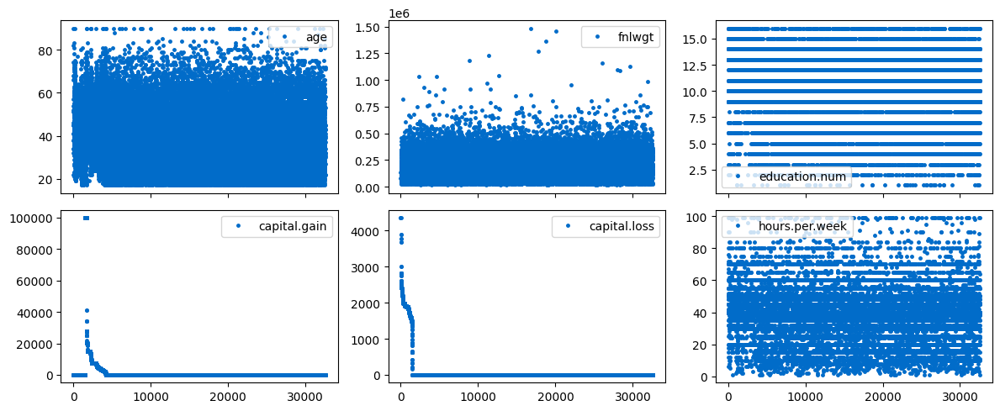

In [14]:
# For all Numerical columnn for all rows 
df.plot(lw=0, marker=".", subplots=True, layout=(-1, 3),figsize=(12,5), markersize=5,color='#016CC9')
plt.tight_layout()

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>4 | Univariate Analysis</div></b>  

### <b><span style='color:#DEB078'>4.1 |</span><span style='color:#016CC9'> Categorical Columns</span></b>  

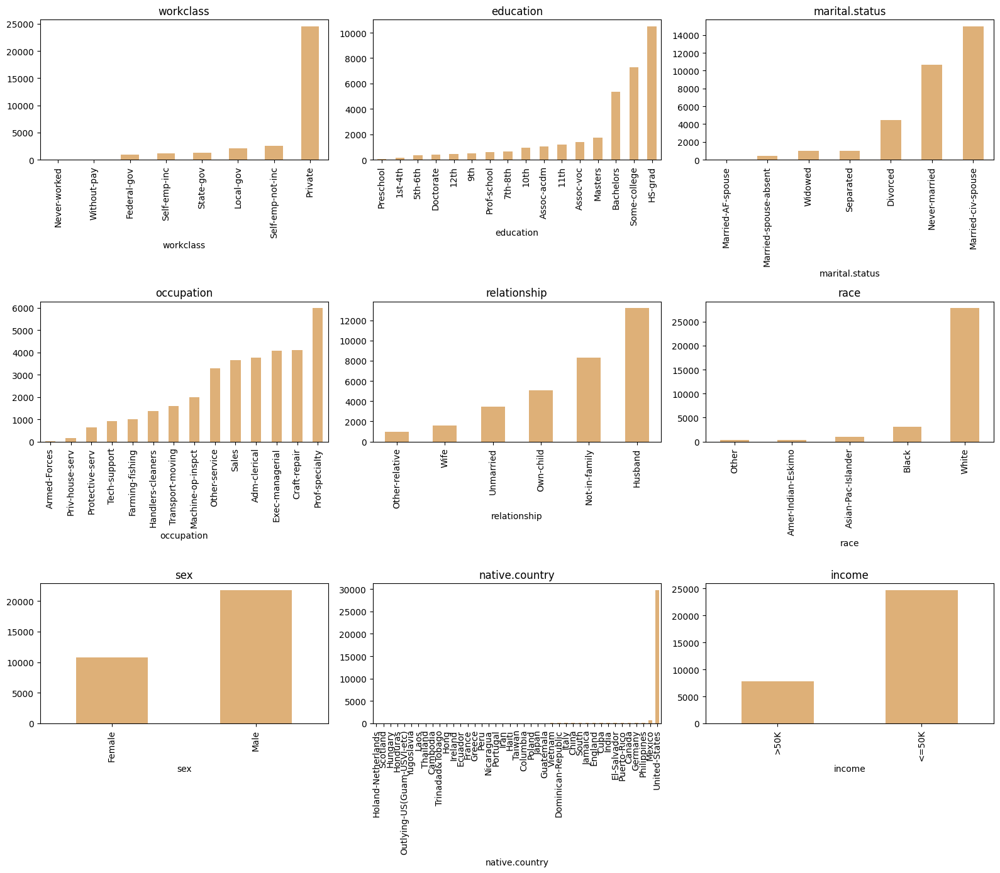

In [15]:
fields=df.select_dtypes(exclude="number").columns

figuresize=(16,14)
cols=3
rows=math.ceil(len(fields)/cols)

plt.subplots(rows,cols,figsize=figuresize)
for i in range(1,len(fields)+1) :
    plt.subplot(rows,cols,i)
    df[fields[i-1]].value_counts().sort_values().plot.bar(color='#DEB078')  
    plt.xticks(rotation=90)
    plt.title(fields[i-1])
    
plt.tight_layout()
plt.show()

In [16]:
# As you can see 'education' and 'education.num' got exact same distribution
# Thats becouse each value of 'education.num' corresponding to label encoded value of 'education' (which is education status) 
education_mapping = {edu_num: df[df['education.num'] == edu_num]['education'].unique()[0] for edu_num in df['education.num'].unique()}
print(education_mapping)

{9: 'HS-grad', 10: 'Some-college', 4: '7th-8th', 6: '10th', 16: 'Doctorate', 15: 'Prof-school', 13: 'Bachelors', 14: 'Masters', 7: '11th', 12: 'Assoc-acdm', 11: 'Assoc-voc', 2: '1st-4th', 3: '5th-6th', 8: '12th', 5: '9th', 1: 'Preschool'}


<span id="prevent_overfitting_ednum">In order to prevent overfitting , we decided to remove `education.num` column</span>

In [17]:
# Since same information repeating , this leads to overfitting.
# In order to prevent overfitting , we decided to remove 'education.num' column
df = df.drop(columns=['education.num'])

#### Apply Grouping

In [18]:
set(df['education'])

{'10th',
 '11th',
 '12th',
 '1st-4th',
 '5th-6th',
 '7th-8th',
 '9th',
 'Assoc-acdm',
 'Assoc-voc',
 'Bachelors',
 'Doctorate',
 'HS-grad',
 'Masters',
 'Preschool',
 'Prof-school',
 'Some-college'}

In [19]:
# Mapping of education levels
education_mapping =  {
    'Preschool': 'Early Education',
    '1st-4th': 'Elementary School',
    '5th-6th': 'Elementary School',
    '7th-8th': 'Middle School',
    '9th': 'High School',
    '10th': 'High School',
    '11th': 'High School',
    '12th': 'High School',
    'HS-grad': 'High School Graduate',
    'Some-college': 'Some College',
    'Assoc-acdm': 'Associate Degree',
    'Assoc-voc': 'Associate Degree',
    'Bachelors': 'Bachelors Degree',
    'Masters': 'Masters Degree',
    'Doctorate': 'Doctorate',
    'Prof-school': 'Professional School'
}

# Apply mapping to the 'education' column
df['education'] = df['education'].map(education_mapping)


In [20]:
set(df['education'])

{'Associate Degree',
 'Bachelors Degree',
 'Doctorate',
 'Early Education',
 'Elementary School',
 'High School',
 'High School Graduate',
 'Masters Degree',
 'Middle School',
 'Professional School',
 'Some College'}

### <b><span style='color:#DEB078'>4.2 |</span><span style='color:#016CC9'> Numerical Columns</span></b>

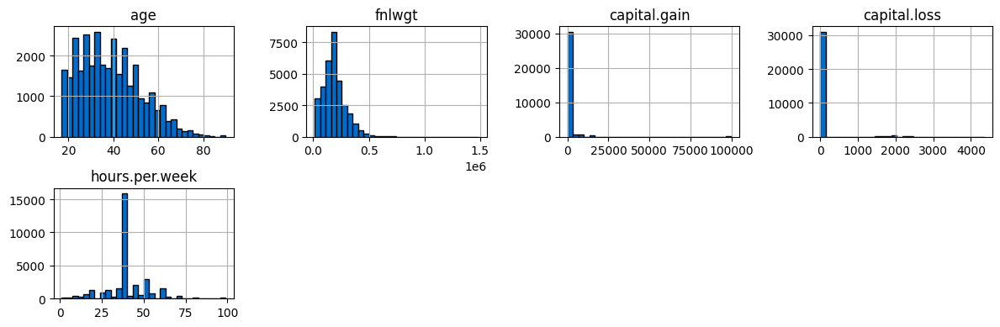

In [21]:
# Plots the histogram for each numerical feature in a separate subplot
figsize_val=(12,4)
layout_val=(-1, 4)
df.hist(bins=30, figsize=figsize_val, layout=layout_val, edgecolor="black",color='#016CC9')
plt.tight_layout();

<span id="reduce_dimensionality">Out of `32562` data , more than `30000` from both capital.gain and capital.loss is zero (more than `90%`).</span> 
* High Percentage of Zero Values suggests that these features might not provide much variability or information for distinguishing between different instances. 
* Since removing features with minimal variability or those that are highly skewed towards a single value(in this case 0) can help reduce dimensionality. 
* So we decided to drop `capital.loss` and `capital.gain` attributes

In [22]:
df.drop(['capital.loss','capital.gain'],axis=1,inplace=True)

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   marital.status  32561 non-null  object
 5   occupation      32561 non-null  object
 6   relationship    32561 non-null  object
 7   race            32561 non-null  object
 8   sex             32561 non-null  object
 9   hours.per.week  32561 non-null  int64 
 10  native.country  32561 non-null  object
 11  income          32561 non-null  object
dtypes: int64(3), object(9)
memory usage: 3.0+ MB


In [24]:
kk=(df.select_dtypes(include='number').columns).to_list()

df2=df[kk]

upper = df2.quantile(0.75)+1.5 *(df2.quantile(0.75)-df2.quantile(0.25))
lower = df2.quantile(0.25)-1.5 *(df2.quantile(0.75)-df2.quantile(0.25))

for i in kk:
    print('\nColumn -> ',i,'')   
    x= df2[ (df2[i]<round(lower[i],2)) |  (df2[i]>round(upper[i],2))][i].to_list()
    print('No of Outliers presesnt -> ',len(x))
    print('\n','*'*10)


Column ->  age 
No of Outliers presesnt ->  143

 **********

Column ->  fnlwgt 
No of Outliers presesnt ->  992

 **********

Column ->  hours.per.week 
No of Outliers presesnt ->  9008

 **********


### <b><span style='color:#DEB078'>4.3 |</span><span style='color:#016CC9'> Target Variable</span></b> 

In [25]:
df[['income']].value_counts(normalize=True).round(decimals=3)*100

income
<=50K     75.9
>50K      24.1
Name: proportion, dtype: float64

In [26]:
temp=dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), height=500, width=1000))

In [27]:
target=df[['income']].value_counts(normalize=True).round(decimals=3)*100

#target.rename(index={1:'Default',0:'Paid'},inplace=True)

pal, color=['#016CC9','#DEB078'], ['#8DBAE2','#EDD3B3']
fig=go.Figure()

fig.add_trace(go.Pie(labels=target.index, values=target, hole=.5, 
                     showlegend=True,sort=False, 
                     marker=dict(colors=color,line=dict(color=pal,width=2.5)),
                     hovertemplate = "%{label} Income: %{value:.2f}%<extra></extra>"))

fig.update_layout(template=temp, title='Target Distribution', 
                  legend=dict(traceorder='reversed',y=1.05,x=0),
                  uniformtext_minsize=15, uniformtext_mode='hide',width=700)
fig.show()

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>5 | Multivariate Analysis</div></b>    

### <b><span style='color:#DEB078'>5.1 |</span><span style='color:#016CC9'> Target variable Relation with Categorical variables</span></b>

In [28]:
df.select_dtypes(exclude='number').columns[:-1]

Index(['workclass', 'education', 'marital.status', 'occupation',
       'relationship', 'race', 'sex', 'native.country'],
      dtype='object')

In [29]:
#Helping Function to get % for categories and overall

def stats(x):
    temp1=(df[[x,'income']].value_counts(normalize=True).round(decimals=3)*100).reset_index().rename(columns={0:'Overall_Percent'})
    Coloumn_To_Aggregate=[x,'income']
    df6=pd.merge(df.groupby(Coloumn_To_Aggregate).size().reset_index(name='ind_siz'), 
                 df.groupby(Coloumn_To_Aggregate[:-1]).size().reset_index(name='Total'), on =Coloumn_To_Aggregate[:-1])
    df6['Category_Percent']=round((df6['ind_siz']/df6['Total'])*100 ,2)
    temp2=df6[[x,'income','Category_Percent']]
    temp3=temp1.merge(temp2,on=[x,'income'])
    return temp3.pivot(columns=x,index='income')

#### **Workclass**

In [30]:
px.histogram(df, x='workclass', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

In [31]:
stats('workclass')

proportion                                              \
workclass Federal-gov Local-gov Never-worked Private Self-emp-inc   
income                                                              
<=50K             1.8       4.5          0.0    59.5          1.5   
>50K              1.1       1.9          NaN    15.8          1.9   

                                                 Category_Percent            \
workclass Self-emp-not-inc State-gov Without-pay      Federal-gov Local-gov   
income                                                                        
<=50K                  5.6       2.9         0.0            61.35     70.52   
>50K                   2.2       1.1         NaN            38.65     29.48   

                                                                        \
workclass Never-worked Private Self-emp-inc Self-emp-not-inc State-gov   
income                                                                   
<=50K            100.0   78.99        44.27            71.51      72.8   
>50K               NaN   21.01        55.73            28.49      27.2   

                       
workclass Without-pay  
income                 
<=50K           100.0  
>50K              NaN

***
--Overall
* 75.9 % (<=50K) -> 54.5 % were from Private  
* 24.1 % (>50k) -> 15.2 % were from Private 

***
--Category wise
* 55.73 % of people from Self-emp-inc background have income >50k
* 38.65 % of people from Federal-gov background  have income >50k
* 29.48 % of people from Local-gov background have income >50k
* 21.87 % of people from Private background have income >50k
***

#### **Education**

In [32]:
px.histogram(df, x='education', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

In [33]:
stats('education')

proportion                                             \
education Associate Degree Bachelors Degree Doctorate Early Education   
income                                                                  
<=50K                  5.6              9.6       0.3             0.2   
>50K                   1.9              6.8       0.9             NaN   

                                                                             \
education Elementary School High School High School Graduate Masters Degree   
income                                                                        
<=50K                   1.5         8.8                 27.1            2.3   
>50K                    0.1         0.6                  5.1            2.9   

                                                         Category_Percent  \
education Middle School Professional School Some College Associate Degree   
income                                                                      
<=50K               1.9                 0.5         18.1            74.44   
>50K                0.1                 1.3          4.3            25.56   

                                                                        \
education Bachelors Degree Doctorate Early Education Elementary School   
income                                                                   
<=50K                58.52     25.91           100.0             95.61   
>50K                 41.48     74.09             NaN              4.39   

                                                                         \
education High School High School Graduate Masters Degree Middle School   
income                                                                    
<=50K           94.04                84.05          44.34         93.81   
>50K             5.96                15.95          55.66          6.19   

                                            
education Professional School Some College  
income                                      
<=50K                   26.56        80.98  
>50K                    73.44        19.02

***
--Overall
* 75.9 % (<=50K) -> 27.1 % were from HS-grad background 
* 24.1 % (>50k) -> 6.8 % were from Bachelors background

***
--Category wise
* 74.09 % of people from Doctorate background have income >50k
* 73.44 % of people from Prof-school background  have income >50k
* 41.48 % of people from Bachelors background have income >50k
***

<span id="categorization">Here we enhance dataset clarity by consolidating diverse education levels into the `School` category. Specifically, `1st-4th`, `5th-6th`, `7th-8th`, `10th`, `9th`, `12th`, and `11th` are grouped together for improved simplicity and meaningful representation.</span>

In [34]:
school = ['Preschool','1st-4th','5th-6th','7th-8th','10th','9th','12th','11th']

# Consolidating education levels for better categorization
# '1st-4th','5th-6th','7th-8th','10th','9th','12th','11th' consider as one group 'school'
df['education'].replace(to_replace = school,value = 'School',inplace = True)

In [35]:
px.histogram(df, x='education', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

In [36]:
stats('education')

proportion                                             \
education Associate Degree Bachelors Degree Doctorate Early Education   
income                                                                  
<=50K                  5.6              9.6       0.3             0.2   
>50K                   1.9              6.8       0.9             NaN   

                                                                             \
education Elementary School High School High School Graduate Masters Degree   
income                                                                        
<=50K                   1.5         8.8                 27.1            2.3   
>50K                    0.1         0.6                  5.1            2.9   

                                                         Category_Percent  \
education Middle School Professional School Some College Associate Degree   
income                                                                      
<=50K               1.9                 0.5         18.1            74.44   
>50K                0.1                 1.3          4.3            25.56   

                                                                        \
education Bachelors Degree Doctorate Early Education Elementary School   
income                                                                   
<=50K                58.52     25.91           100.0             95.61   
>50K                 41.48     74.09             NaN              4.39   

                                                                         \
education High School High School Graduate Masters Degree Middle School   
income                                                                    
<=50K           94.04                84.05          44.34         93.81   
>50K             5.96                15.95          55.66          6.19   

                                            
education Professional School Some College  
income                                      
<=50K                   26.56        80.98  
>50K                    73.44        19.02

***
--Overall
* 75.9 % (<=50K) -> 27.1 % were from HS-grad background 
* 24.1 % (>50k) -> 6.8 % were from Bachelors background

***
--Category wise
* 74.09 % of people from Doctorate background have income >50k
* 73.44 % of people from Prof-school background  have income >50k
* 41.48 % of people from Bachelors background have income >50k
***

#### **Marital.status**

In [37]:
px.histogram(df, x='marital.status', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

In [38]:
stats('marital.status')

proportion                                       \
marital.status   Divorced Married-AF-spouse Married-civ-spouse   
income                                                           
<=50K                12.2               0.0               25.4   
>50K                  1.4               0.0               20.6   

                                                                      \
marital.status Married-spouse-absent Never-married Separated Widowed   
income                                                                 
<=50K                            1.2          31.3       2.9     2.8   
>50K                             0.1           1.5       0.2     0.3   

               Category_Percent                                       \
marital.status         Divorced Married-AF-spouse Married-civ-spouse   
income                                                                 
<=50K                     89.58             56.52              55.32   
>50K                      10.42             43.48              44.68   

                                                                      
marital.status Married-spouse-absent Never-married Separated Widowed  
income                                                                
<=50K                          91.87          95.4     93.56   91.44  
>50K                            8.13           4.6      6.44    8.56

***
--Overall
* 75.9 % (<=50K) -> 31.3 % were Never-married
* 24.1 % (>50k) -> 20.6 % were Married-civ-spouse 

***
--Category wise
* 44.68 % of people from Married-civ-spouse category have income >50k
* 43.48 % of people from Married-AF-spouse category  have income >50k

***

#### **Occupation**

In [39]:
px.histogram(df, x='occupation', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

In [40]:
stats('occupation')

proportion                                            \
occupation Adm-clerical Armed-Forces Craft-repair Exec-managerial   
income                                                              
<=50K              10.0          0.0          9.7             6.4   
>50K                1.6          0.0          2.9             6.0   

                                                                              \
occupation Farming-fishing Handlers-cleaners Machine-op-inspct Other-service   
income                                                                         
<=50K                  2.7               3.9               5.4           9.7   
>50K                   0.4               0.3               0.8           0.4   

                                                                              \
occupation Priv-house-serv Prof-specialty Protective-serv Sales Tech-support   
income                                                                         
<=50K                  0.5           12.1             1.3   8.2          2.0   
>50K                   0.0            6.3             0.6   3.0          0.9   

                            Category_Percent                            \
occupation Transport-moving     Adm-clerical Armed-Forces Craft-repair   
income                                                                   
<=50K                   3.9            86.55        88.89        77.34   
>50K                    1.0            13.45        11.11        22.66   

                                                              \
occupation Exec-managerial Farming-fishing Handlers-cleaners   
income                                                         
<=50K                 51.6           88.43             93.72   
>50K                  48.4           11.57              6.28   

                                                                           \
occupation Machine-op-inspct Other-service Priv-house-serv Prof-specialty   
income                                                                      
<=50K                  87.51         95.84           99.33          65.74   
>50K                   12.49          4.16            0.67          34.26   

                                                                 
occupation Protective-serv  Sales Tech-support Transport-moving  
income                                                           
<=50K                67.49  73.07         69.5            79.96  
>50K                 32.51  26.93         30.5            20.04

***
--Overall
* 75.9 % (<=50K) -> 10.0 % were from Adm-clerical  
* 24.1 % (>50k) ->   6.0 % were from Exec-managerial 

***
--Category wise
* 48.4 % of people from Exec-managerial have income >50k
* 44.9 % of people from Prof-specialty  have income >50k
***

#### **Relationship**

In [41]:
px.histogram(df, x='relationship', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

In [42]:
stats('relationship')

proportion                                                        \
relationship    Husband Not-in-family Other-relative Own-child Unmarried Wife   
income                                                                          
<=50K              22.3          22.9            2.9      15.4       9.9  2.5   
>50K               18.2           2.6            0.1       0.2       0.7  2.3   

             Category_Percent                                         \
relationship          Husband Not-in-family Other-relative Own-child   
income                                                                 
<=50K                   55.14         89.69          96.23     98.68   
>50K                    44.86         10.31           3.77      1.32   

                               
relationship Unmarried   Wife  
income                         
<=50K            93.67  52.49  
>50K              6.33  47.51

***
--Overall
* 75.9 % (<=50K) -> 22.9 % were Not-in-family 
* 24.1 % (>50k) ->   18.2 % were Husband

***
--Category wise
* 47.51 % of people from wife category have income >50k
* 44.86 % of people from Husband  have income >50k
***

#### Race

In [43]:
px.histogram(df, x='race', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

In [44]:
stats('race')

proportion                                       \
race   Amer-Indian-Eskimo Asian-Pac-Islander Black Other White   
income                                                           
<=50K                 0.8                2.3   8.4   0.8  63.6   
>50K                  0.1                0.8   1.2   0.1  21.9   

         Category_Percent                                          
race   Amer-Indian-Eskimo Asian-Pac-Islander  Black  Other  White  
income                                                             
<=50K               88.42              73.44  87.61  90.77  74.41  
>50K                11.58              26.56  12.39   9.23  25.59

***
--Overall
* 75.9 % (<=50K) -> 63.6 % were White  
* 24.1 % (>50k) ->  21.9 % were White

***
--Category wise
* 26.56 % of people from Asian-Pac-Islander category have income >50k
* 25.59 % of people from white category have income >50k
***

#### Sex

In [45]:
px.histogram(df, x='sex', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

In [46]:
stats('sex')

proportion       Category_Percent       
sex        Female  Male           Female   Male
income                                         
<=50K        29.5  46.5            89.05  69.43
>50K          3.6  20.5            10.95  30.57

***
--Overall
* 75.9 % (<=50K) -> 46.5 % were Male  
* 24.1 % (>50k) ->  20.5 % were Male

***
--Category wise
* 10.95 % of people from male category have income >50k
* 30.57 % of people from female category have income >50k
***

#### Native.country

In [47]:
px.histogram(df, x='native.country', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

In [48]:
stats('native.country')

proportion                                                \
native.country   Cambodia Canada China Columbia Cuba Dominican-Republic   
income                                                                    
<=50K                 0.0    0.3   0.2      0.2  0.2                0.2   
>50K                  0.0    0.1   0.1      0.0  0.1                0.0   

                                                                            \
native.country Ecuador El-Salvador England France Germany Greece Guatemala   
income                                                                       
<=50K              0.1         0.3     0.2    0.1     0.3    0.1       0.2   
>50K               0.0         0.0     0.1    0.0     0.1    0.0       0.0   

                                                                          \
native.country Haiti Holand-Netherlands Honduras Hong Hungary India Iran   
income                                                                     
<=50K            0.1                0.0      0.0  0.0     0.0   0.2  0.1   
>50K             0.0                NaN      0.0  0.0     0.0   0.1  0.1   

                                                                  \
native.country Ireland Italy Jamaica Japan Laos Mexico Nicaragua   
income                                                             
<=50K              0.1   0.1     0.2   0.1  0.0    1.9       0.1   
>50K               0.0   0.1     0.0   0.1  0.0    0.1       0.0   

                                                                            \
native.country Outlying-US(Guam-USVI-etc) Peru Philippines Poland Portugal   
income                                                                       
<=50K                                 0.0  0.1         0.4    0.1      0.1   
>50K                                  NaN  0.0         0.2    0.0      0.0   

                                                                           \
native.country Puerto-Rico Scotland South Taiwan Thailand Trinadad&Tobago   
income                                                                      
<=50K                  0.3      0.0   0.2    0.1      0.0             0.1   
>50K                   0.0      0.0   0.0    0.1      0.0             0.0   

                                                Category_Percent         \
native.country United-States Vietnam Yugoslavia         Cambodia Canada   
income                                                                    
<=50K                   68.9     0.2        0.0            63.16  67.77   
>50K                    22.5     0.0        0.0            36.84  32.23   

                                                                              \
native.country  China Columbia   Cuba Dominican-Republic Ecuador El-Salvador   
income                                                                         
<=50K           73.33    96.61  73.68              97.14   85.71       91.51   
>50K            26.67     3.39  26.32               2.86   14.29        8.49   

                                                               \
native.country England France Germany Greece Guatemala  Haiti   
income                                                          
<=50K            66.67  58.62   67.88  72.41     95.31  90.91   
>50K             33.33  41.38   32.12  27.59      4.69   9.09   

                                                                               \
native.country Holand-Netherlands Honduras  Hong Hungary India   Iran Ireland   
income                                                                          
<=50K                       100.0    92.31  70.0   76.92  60.0  58.14   79.17   
>50K                          NaN     7.69  30.0   23.08  40.0  41.86   20.83   

                                                              \
native.country  Italy Jamaica  Japan   Laos Mexico Nicaragua   
income                                                         
<=50K           65.75   87.65  61.29  88.89  94.

***
--Overall
* 75.9 % (<=50K) -> 67.6 % were from United-States  
* 24.1 % (>50k) ->  22.0 % were from United-States 

***
--Category wise
* 41.86 % of people from Iran have income >50k
* 41.38 % of people from France have income >50k
* 24.58 % of people from United-States  have income >50k
***

### <b><span style='color:#DEB078'>4.2 |</span><span style='color:#016CC9'> Target variable Relation with Numerical variables</span></b> 

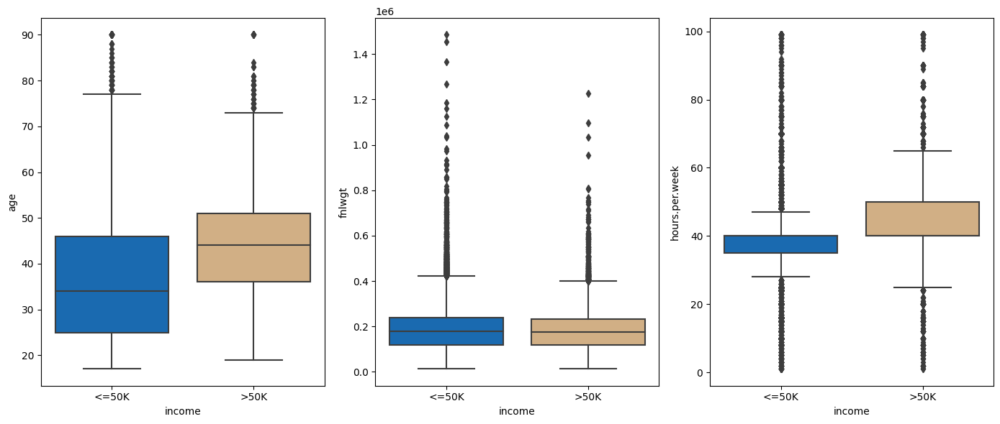

In [51]:
p=df.select_dtypes(include='number').columns.to_list()
p.append("income")
y=3
x=math.ceil((len(p)-1)/y)

plt.subplots(x,y,figsize=(14,6))

for i in range(1,len(p)) :
    plt.subplot(x,y,i)
    sns.boxplot(data=df,y=p[i-1],x='income',palette=['#016CC9','#DEB078'])
    #plt.xlabel(vars[i-1])
    #plt.title(vars[i-1])
plt.tight_layout()    
plt.show()

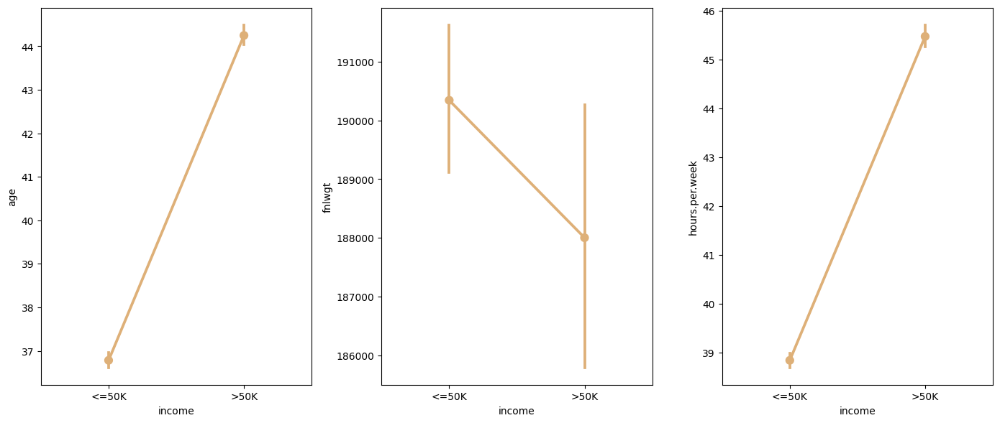

In [52]:
p=df.select_dtypes(include='number').columns.to_list()
p.append("income")
y=3
x=math.ceil((len(p)-1)/y)

plt.subplots(x,y,figsize=(14,6))

for i in range(1,len(p)) :
    plt.subplot(x,y,i)
    sns.pointplot(data=df,y=p[i-1],x='income',color='#DEB078')
    #plt.xlabel(vars[i-1])
    #plt.title(vars[i-1])
plt.tight_layout()    
plt.show()

### <b><span style='color:#DEB078'>4.3 |</span><span style='color:#016CC9'> Other relationships</span></b> 

In [53]:
categorical = ['workclass','education','marital.status', 'occupation', 'relationship',
               'race', 'sex','native.country','income']
numerical = list(set(df.columns)-set(categorical))

In [54]:
# Replace '?' with NaN in numeric columns
df_numeric = df[numerical]

# Create a correlation matrix heatmap
fig = px.imshow(df_numeric.corr().round(2), zmin=-1, zmax=1, text_auto=True, width=1200, height=650, aspect=None, color_continuous_scale=['#016CC9', '#DEB078'])
fig.show()

* No relationships among variables

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>6 | Data Preprocessing and Feature Engineering</div></b>      

### <b><span style='color:#DEB078'>5.1 |</span><span style='color:#016CC9'> Handling Null Values </span></b>  

1. [Replacing ? with null (🔗)](#replace_?_with_null)
2. [Replacing null's with most frequent element (🔗)](#common_nan)

### <b><span style='color:#DEB078'>5.2 |</span><span style='color:#016CC9'> Mitige numerical bias</span></b>   

1. [mitigate numerical bias in the `education.num` column (🔗)](#mitigate_numerical)

    <span>In order to mitigate numerical bias in the `education.num` column, the feature was transformed into a categorical representation by converting the numerical values to strings. This conversion allows for a more equitable treatment of education levels, addressing potential model sensitivity to numerical relationships among education categories.</span>

### <b><span style='color:#DEB078'>5.3 |</span><span style='color:#016CC9'> Prevent Overfitting</span></b>   

1. [In order to prevent overfitting removing `education.num` column (🔗)](#prevent_overfitting_ednum)

    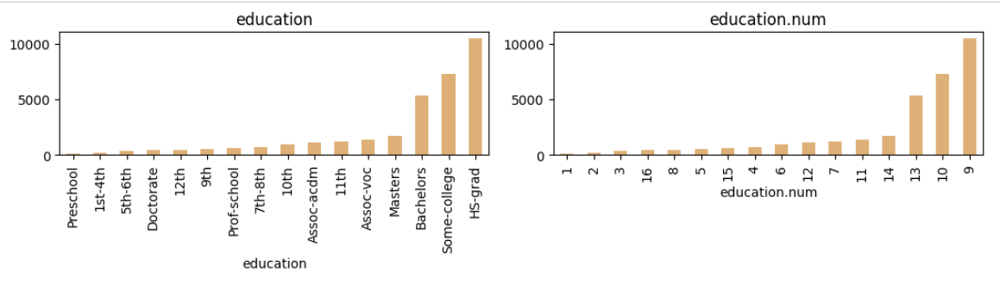
    <span>`education` and `education.num` got exact same distribution, Thats because each value of `education` (which is education status) corresponding to value of `education.num`</span>

| education | education.num  |
|------|-------------------|
|  '1' | Preschool         |
|  '2' | 1st-4th           |
|  '3' | 5th-6th           |
|  '4' | 7th-8th           |
|  '5' | 9th               |
|  '6' | 10th              |
|  '7' | 11th              |
|  '8' | 12th              |
|  '9' | HS-grad           |
| '10' | Some-college      |
| '11' | Assoc-voc         |
| '12' | Assoc-acdm        |
| '13' | Bachelors         |
| '14' | Masters           |
| '15' | Prof-school       |
| '16' | Doctorate         |



### <b><span style='color:#DEB078'>5.4 |</span><span style='color:#016CC9'> Dimensionality Reduction</span></b>   

1. [Removing drop `capital.loss` and `capital.gain` columns for dimensionality reduction (🔗)](#reduce_dimensionality) 

    <span id="reduce_dimensionality">Out of `32562` data , more than `30000` from both capital.gain and capital.loss is zero (more than `90%`).</span> 
    * High Percentage of Zero Values suggests that these features might not provide much variability or information for distinguishing between different instances. 
    * Since removing features with minimal variability or those that are highly skewed towards a single value(in this case 0) can help reduce dimensionality. 
    * So we decided to drop `capital.loss` and `capital.gain` attributes

### <b><span style='color:#DEB078'>5.7 |</span><span style='color:#016CC9'> Categorization</span></b>   

1. [Categorize School Students (🔗)](#categorization)  

    <span>Here we enhance dataset clarity by consolidating diverse education levels into the `School` category. Specifically, `1st-4th`, `5th-6th`, `7th-8th`, `10th`, `9th`, `12th`, and `11th` are grouped together for improved simplicity and meaningful representation.</span>

### <b><span style='color:#DEB078'>5.8 |</span><span style='color:#016CC9'> Handling Categorical Variable </span></b> 

#### Applying Lable Encoding for `Education` Column

In [55]:
# Updated academic greatness groups mapping
academic_greatness_groups = {
    'Early Education': 1,
    'Elementary School': 2,
    'Middle School': 3,
    'High School': 4,
    'High School Graduate': 5,
    'Some College': 6,
    'Associate Degree': 7,
    'Bachelors Degree': 8,
    'Masters Degree': 9,
    'Doctorate': 10,
    'Professional School': 11
}

# Apply label encoding to the 'education' column
label_encoder = LabelEncoder()
df['education'] = df['education'].map(academic_greatness_groups)

#### Applying One-Hot Encoding for Categorical Data Columns

In [56]:
cat_col_new = ['workclass', 'marital.status', 'occupation', 'relationship','race', 'sex','native.country','income']

In [57]:
df[cat_col_new].nunique()

workclass          8
marital.status     7
occupation        14
relationship       6
race               5
sex                2
native.country    41
income             2
dtype: int64

when having 41 unique values for `native.country` , it's not suitable to apply one hot encoding. in order to apply one hot encoding lets apply  grouping technique to `native.country` column

Apply grouping to `native.country` column, based on **region**

In [58]:
# Define regions based on both geographical and economic aspects
region_mapping = {
    'Asia-Pacific': ['China', 'Hong', 'India', 'Iran', 'Japan', 'Taiwan'],
    'Europe': ['England', 'France', 'Germany', 'Greece', 'Hungary', 'Ireland', 'Italy', 'Poland', 'Portugal', 'Scotland', 'Yugoslavia'],
    'North-America': ['Canada', 'Cuba', 'Dominican-Republic', 'El-Salvador', 'Guatemala', 'Haiti', 'Honduras', 'Jamaica', 'Mexico', 'Nicaragua', 'Outlying-US(Guam-USVI-etc)', 'Puerto-Rico', 'Trinadad&Tobago'],
    'Latin-America': ['Columbia', 'Ecuador', 'Peru'],
    'Other': ['Holand-Netherlands', 'South'],
    'United-States':['United-States']
}

# Create a new column 'region' based on the mapping
df['region'] = df['native.country'].apply(lambda country: next((region for region, countries in region_mapping.items() if country in countries), 'Unknown'))

# Drop the original 'native.country' column
df.drop('native.country', axis=1, inplace=True)

In [59]:
px.histogram(df, x='region', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

In [60]:
cat_col_new = ['workclass', 'marital.status', 'occupation', 'relationship','race', 'sex','region','income']
df[cat_col_new].nunique()

workclass          8
marital.status     7
occupation        14
relationship       6
race               5
sex                2
region             7
income             2
dtype: int64

Now this all categorical columns have relatively small unique values. Hence this is applicable for ***One Hot Encoding***

In order to avoid overfitting lets remove columns that we don't need after creating dummy variables dataframe

In [61]:
# columns which we don't need after creating dummy variables dataframe
cols = ['workclass_Govt_employess','marital.status_Never-married','occupation_Other-service','relationship_Other-relative',
        'race_Black','sex_Male','region_North-America','income_>50K']

In [62]:
class DataFrameSelector(TransformerMixin):
    def __init__(self,attribute_names):
        self.attribute_names = attribute_names

    def fit(self,X,y = None):
        return self

    def transform(self,X):
        return X[self.attribute_names]

class dummies(TransformerMixin):
    def __init__(self,cols):
        self.cols = cols

    def fit(self,X,y = None):
        return self

    def transform(self,X):
        df = pd.get_dummies(X)
        df_new = df[df.columns.difference(cols)]
#difference returns the original columns, with the columns passed as argument removed.
        return df_new

pipeline_cat=Pipeline([('selector',DataFrameSelector(cat_col_new)),
                      ('dummies',dummies(cols))])
cat_df = pipeline_cat.fit_transform(df)
cat_df.shape

(32561, 44)

In [63]:
cat_df.columns

Index(['income_<=50K', 'marital.status_Divorced',
       'marital.status_Married-AF-spouse', 'marital.status_Married-civ-spouse',
       'marital.status_Married-spouse-absent', 'marital.status_Separated',
       'marital.status_Widowed', 'occupation_Adm-clerical',
       'occupation_Armed-Forces', 'occupation_Craft-repair',
       'occupation_Exec-managerial', 'occupation_Farming-fishing',
       'occupation_Handlers-cleaners', 'occupation_Machine-op-inspct',
       'occupation_Priv-house-serv', 'occupation_Prof-specialty',
       'occupation_Protective-serv', 'occupation_Sales',
       'occupation_Tech-support', 'occupation_Transport-moving',
       'race_Amer-Indian-Eskimo', 'race_Asian-Pac-Islander', 'race_Other',
       'race_White', 'region_Asia-Pacific', 'region_Europe',
       'region_Latin-America', 'region_Other', 'region_United-States',
       'region_Unknown', 'relationship_Husband', 'relationship_Not-in-family',
       'relationship_Own-child', 'relationship_Unmarried', 're

### <b><span style='color:#DEB078'>5.8 |</span><span style='color:#016CC9'> Feature Scaling </span></b> 

#### Normalization

In [64]:
num_col_new = ['age','education','fnlwgt', 'hours.per.week']

In [65]:
from sklearn.pipeline import Pipeline
from sklearn.base import TransformerMixin
from sklearn.preprocessing import MinMaxScaler,StandardScaler

scaler = MinMaxScaler()
pd.DataFrame(scaler.fit_transform(df[num_col_new]),columns = num_col_new).head()

,age,education,fnlwgt,hours.per.week
0,1.000000,0.4,0.043987,0.397959
1,0.890411,0.4,0.081896,0.173469
2,0.671233,0.5,0.118021,0.397959
3,0.506849,0.2,0.086982,0.397959
4,0.328767,0.5,0.171404,0.397959


In [66]:
class DataFrameSelector(TransformerMixin):
    def __init__(self,attribute_names):
        self.attribute_names = attribute_names

    def fit(self,X,y = None):
        return self

    def transform(self,X):
        return X[self.attribute_names]


class num_trans(TransformerMixin):
    def __init__(self):
        pass

    def fit(self,X,y=None):
        return self

    def transform(self,X):
        df = pd.DataFrame(X)
        df.columns = num_col_new
        return df


pipeline = Pipeline([('selector',DataFrameSelector(num_col_new)),
                     ('scaler',MinMaxScaler()),
                    ('transform',num_trans())])

This Pipeline consists of three sequential steps:

*   **First,** it selects specific numerical columns ('num_col_new') from the input data;
*   **Second,** it scales those selected columns using MinMaxScaler;
*   **Finally,** it transforms the resulting data into a DataFrame with column names set to 'num_col_new' using a custom transformer 'num_trans'.

This pipeline efficiently organizes and executes these data processing steps in a cohesive manner for numerical feature handling


In [67]:
num_df = pipeline.fit_transform(df)
num_df.shape

(32561, 4)

In [68]:
cat_df['id'] = pd.Series(range(cat_df.shape[0]))
num_df['id'] = pd.Series(range(num_df.shape[0]))

In [69]:
final_df = pd.merge(cat_df,num_df,how = 'inner', on = 'id')
print(f"Number of observations in final dataset: {final_df.shape}")

Number of observations in final dataset: (32561, 49)


### <b><span style='color:#DEB078'>5.9 |</span><span style='color:#016CC9'> Split Dataset </span></b> 

In [70]:
y = final_df['income_<=50K']
final_df.drop(labels = ['id','income_<=50K','fnlwgt'],axis = 1,inplace = True)
X = final_df

In [71]:
final_df = pd.merge(cat_df,num_df,how = 'inner', on = 'id')
print(f"Number of observations in final dataset: {final_df.shape}")

Number of observations in final dataset: (32561, 49)


### <b><span style='color:#DEB078'>5.10 |</span><span style='color:#016CC9'> Resampling </span></b> 

Take a look to Income class distribution

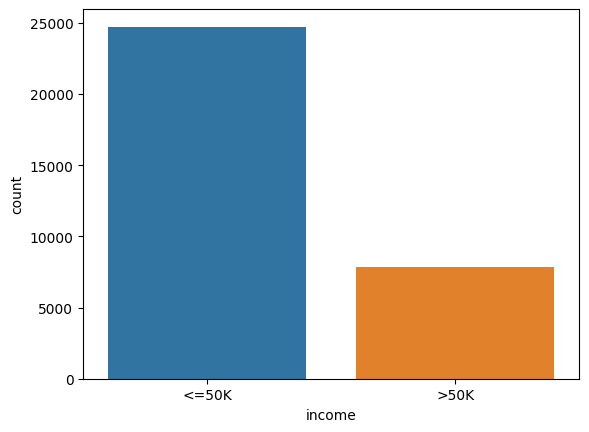

income
<=50K    24720
>50K      7841
Name: count, dtype: int64

In [72]:
sns.countplot(x="income", data= df)
plt.show()
df["income"].value_counts()

Implementating model on imbalanced data

In [73]:
X_train1,X_test1,y_train1,y_test1 = train_test_split(X,y,test_size =0.15,random_state = 42)
# fitting the model
lr=LogisticRegression()
lr.fit(X_train1,y_train1)
# predict
y_pred4=lr.predict(X_test1)
print("Accuracy:",metrics.accuracy_score(y_test1, y_pred4))
print("Precision:",metrics.precision_score(y_test1, y_pred4))
print("Recall:",metrics.recall_score(y_test1, y_pred4))
print("F1 score:",metrics.f1_score(y_test1, y_pred4))
print("AUC :",metrics.roc_auc_score(y_test1, y_pred4))

Accuracy: 0.8374616171954964
Precision: 0.8703796203796204
Recall: 0.9268617021276596
F1 score: 0.8977331272539928
AUC : 0.7327641843971631


**Resampling for Class Imbalance in Machine Learning**

In dealing with imbalanced datasets, resampling is a common technique to address the skewed distribution of classes. Two main strategies are employed:

1. **Over-sampling:**
   - **Objective:** Increase minority class instances.
   - **Implementation:** Duplicate random records from the minority class.
   - **Advantages:** Balances class distribution.
   - **Drawbacks:** May lead to overfitting due to duplicated records.

2. **Under-sampling:**
   - **Objective:** Decrease majority class instances.
   - **Implementation:** Remove random records from the majority class.
   - **Advantages:** Improves model runtime and memory usage for large datasets.
   - **Drawbacks:** May result in loss of information.

*Note: While these techniques address class imbalance, their simplistic implementations come with trade-offs such as overfitting or loss of information.*

![resampling.png](https://github.com/PasanAbeysekara/group-43-dataset/assets/69195287/fe134eae-4564-4f90-9739-bbe62094ad74)


***For this case we use undersampling***

In [74]:
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler()
X_rus, y_rus = rus.fit_resample(X, y)

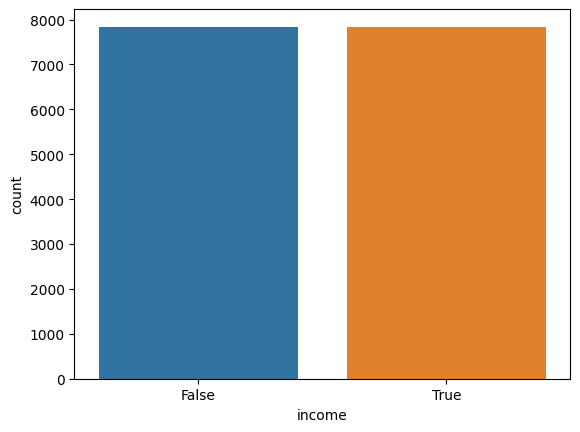

In [75]:
y_rus = pd.DataFrame(y_rus)
y_rus.columns = ["income"]
sns.countplot(x=y_rus["income"])
plt.show()

### <b><span style='color:#DEB078'>5.11 |</span><span style='color:#016CC9'> Train data - Test data </span></b> 

In [76]:
X_train,X_test,y_train,y_test = train_test_split(X_rus,y_rus,test_size =0.15,random_state = 42)

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>6 | Hyperparameter Tuning</div></b>      

### <b><span style='color:#DEB078'>6.1 |</span><span style='color:#016CC9'> Evaluating of Logistic Regression </span></b> 

### Grid Search

In [77]:
%%time
from sklearn.model_selection import GridSearchCV
lr = LogisticRegression(class_weight='balanced',random_state=42)
param_grid = {
    'C': [0.1,0.2,0.3,0.4],
    'penalty': ['l1', 'l2'],
    'class_weight':[{0: 1, 1: 1},{ 0:0.67, 1:0.33 },{ 0:0.75, 1:0.25 },{ 0:0.8, 1:0.2 }]}
CV_rfc = GridSearchCV(estimator=lr, param_grid=param_grid, cv= 5)
CV_rfc.fit(X_train, y_train)
print(CV_rfc.best_params_)

{'C': 0.3, 'class_weight': {0: 1, 1: 1}, 'penalty': 'l2'}
CPU times: user 42.4 s, sys: 28.6 s, total: 1min 11s
Wall time: 18.7 s


In [78]:
%%time
#fitting the model
lr1=LogisticRegression(C=0.4, random_state=4 ,penalty='l2', class_weight={0:1,1:1})
lr1.fit(X_train,y_train)
# predict
y_pred1=lr1.predict(X_test)

CPU times: user 722 ms, sys: 487 ms, total: 1.21 s
Wall time: 308 ms


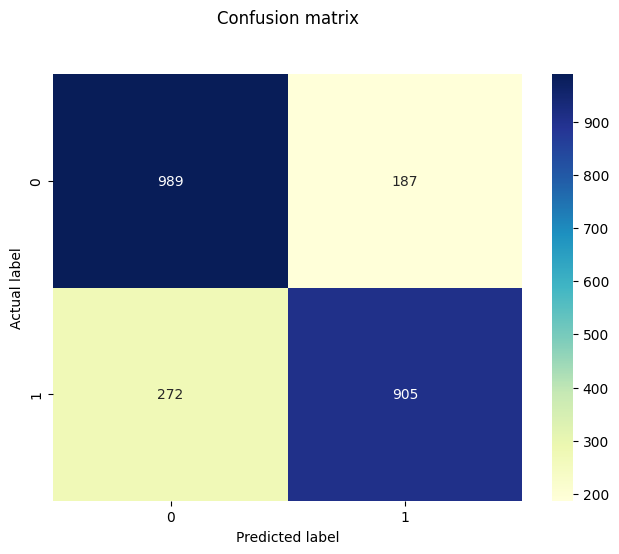

In [79]:
cf_matrix = confusion_matrix(y_test, y_pred1)
sns.heatmap(pd.DataFrame(cf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

In [80]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred1))
print("Precision:",metrics.precision_score(y_test, y_pred1))
print("Recall:",metrics.recall_score(y_test, y_pred1))
print("F1 score:",metrics.f1_score(y_test, y_pred1))
print("AUC :",metrics.roc_auc_score(y_test, y_pred1))

Accuracy: 0.8049298767530811
Precision: 0.8287545787545788
Recall: 0.7689039932030586
F1 score: 0.7977082415160864
AUC : 0.8049451938804408


### ROC Curve

An ROC curve (receiver operating characteristic curve) is a graph showing the performance of a classification model at all classification thresholds. This curve plots two parameters:

    True Positive Rate
    False Positive Rate
    
![gfh.png](https://github.com/PasanAbeysekara/group-43-dataset/assets/69195287/a3fe5b24-32dc-4080-b29c-ea21208e0bff)

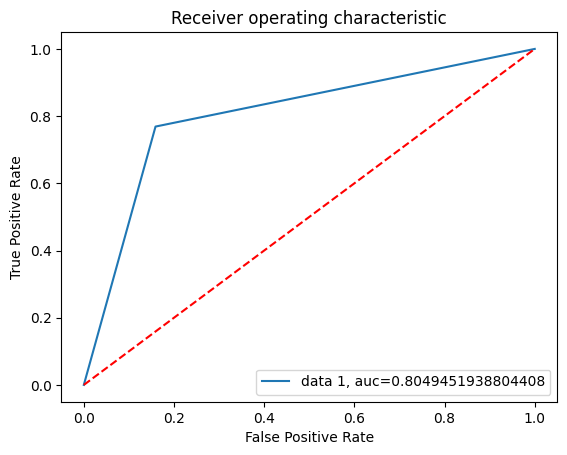

In [81]:
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred1)
auc = metrics.roc_auc_score(y_test, y_pred1)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.show()

### <b><span style='color:#DEB078'>6.2 |</span><span style='color:#016CC9'> Recursive Feature Elimination </span></b> 

* The Recursive Feature Elimination (or RFE) works by recursively removing attributes and building a model on those attributes that remain.
* It uses the model accuracy to identify which attributes (and combination of attributes) contribute the most to predicting the target attribute.
* As the name suggests, this method eliminates worst performing features on a particular model one after the other until the best subset of features are known.

![vnb.png](https://github.com/PasanAbeysekara/group-43-dataset/assets/69195287/57ae2b08-f184-49c1-847d-66cb7de22dee)

In [82]:
%%time
from sklearn.feature_selection import RFE

# feature extraction
lr = LogisticRegression()
rfe = RFE(lr, n_features_to_select=15)
lr3 = rfe.fit(X_train, y_train)

print("Num Features: ", lr3.n_features_)
print("Selected Features: ",  lr3.support_)
print("Feature Ranking: ", lr3.ranking_)

Num Features:  15
Selected Features:  [False  True  True False False False False False False  True False False
 False False False  True  True  True False False False False False False
 False  True False False False False  True False  True  True  True False
 False False False False False False  True  True  True  True]
Feature Ranking:  [11  1  1 22 21 10  4 30  3  1 17 28  6 12  2  1  1  1  5  9 18 24 25 19
 15  1 31 16 14 20  1  8  1  1  1  7 26 29 27 23 13 32  1  1  1  1]
CPU times: user 17.7 s, sys: 12.3 s, total: 30 s
Wall time: 8.54 s


**Features sorted by their rank:**

In [83]:
feature = list(X_train.columns.values)
print(sorted(zip(map(lambda x: round(x, 4), lr3.ranking_), feature)))

[(1, 'age'), (1, 'education'), (1, 'hours.per.week'), (1, 'marital.status_Married-AF-spouse'), (1, 'marital.status_Married-civ-spouse'), (1, 'occupation_Exec-managerial'), (1, 'occupation_Protective-serv'), (1, 'occupation_Sales'), (1, 'occupation_Tech-support'), (1, 'region_Latin-America'), (1, 'relationship_Not-in-family'), (1, 'relationship_Unmarried'), (1, 'relationship_Wife'), (1, 'sex_Female'), (1, 'workclass_Without-pay'), (2, 'occupation_Prof-specialty'), (3, 'occupation_Craft-repair'), (4, 'occupation_Adm-clerical'), (5, 'occupation_Transport-moving'), (6, 'occupation_Machine-op-inspct'), (7, 'workclass_Federal-gov'), (8, 'relationship_Own-child'), (9, 'race_Amer-Indian-Eskimo'), (10, 'marital.status_Widowed'), (11, 'marital.status_Divorced'), (12, 'occupation_Priv-house-serv'), (13, 'workclass_Self-emp-not-inc'), (14, 'region_Unknown'), (15, 'region_Europe'), (16, 'region_United-States'), (17, 'occupation_Farming-fishing'), (18, 'race_Asian-Pac-Islander'), (19, 'region_Asia-P

Consider only attributes having Rank 1

In [84]:
result = sorted(zip(map(lambda x: round(x, 4), lr3.ranking_), feature))

# Filter for attributes with rank 1
rank_1_attributes = [attr for rank, attr in result if rank == 1]

# Print the result
print(rank_1_attributes)

['age', 'education', 'hours.per.week', 'marital.status_Married-AF-spouse', 'marital.status_Married-civ-spouse', 'occupation_Exec-managerial', 'occupation_Protective-serv', 'occupation_Sales', 'occupation_Tech-support', 'region_Latin-America', 'relationship_Not-in-family', 'relationship_Unmarried', 'relationship_Wife', 'sex_Female', 'workclass_Without-pay']


In [85]:
X_train_f = X_train[rank_1_attributes]

X_test_f = X_test[rank_1_attributes]

lr4=LogisticRegression(C=0.4, random_state=4 ,penalty='l2', class_weight={0:1,1:1})
%time lr4.fit(X_train_f,y_train)

CPU times: user 377 ms, sys: 263 ms, total: 639 ms
Wall time: 160 ms


LogisticRegression(C=0.4, class_weight={0: 1, 1: 1}, random_state=4)

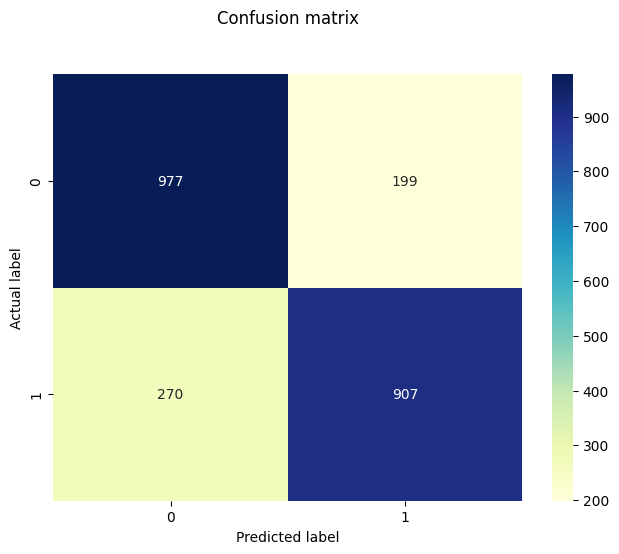

Accuracy: 0.800679983000425
Precision: 0.8200723327305606
Recall: 0.7706032285471538
F1 score: 0.7945685501533071
AUC : 0.800692770736162


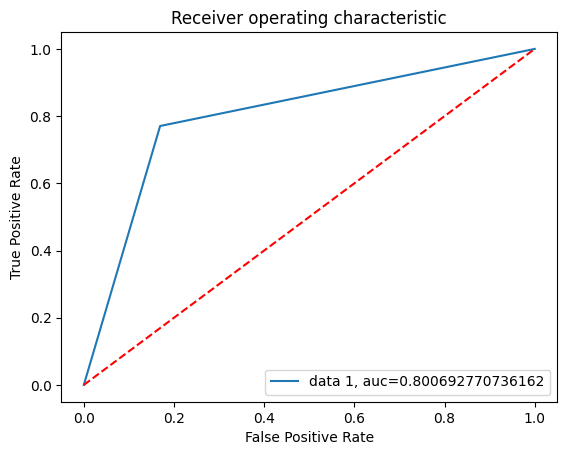

In [86]:
# predict
y_pred4=lr4.predict(X_test_f)
cf_matrix = confusion_matrix(y_test, y_pred4)
sns.heatmap(pd.DataFrame(cf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

print("Accuracy:",metrics.accuracy_score(y_test, y_pred4))
print("Precision:",metrics.precision_score(y_test, y_pred4))
print("Recall:",metrics.recall_score(y_test, y_pred4))
print("F1 score:",metrics.f1_score(y_test, y_pred4))
print("AUC :",metrics.roc_auc_score(y_test, y_pred4))

fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred4)
auc = metrics.roc_auc_score(y_test, y_pred4)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.show()

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>7 | PCA Analysis</div></b>      

Principal Component Analysis (or PCA) uses linear algebra to transform the dataset into a compressed form.

Generally this is called a data reduction technique. A property of PCA is that you can choose the number of dimensions or principal component in the transformed result.

In this case we will use it to analyse the feature importanace

<BarContainer object of 39 artists>

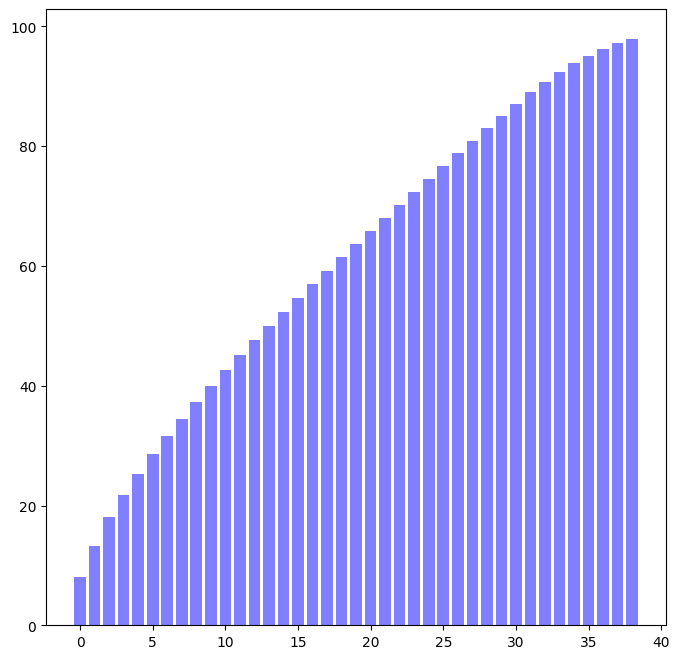

In [87]:
from sklearn.preprocessing import StandardScaler
X_std = StandardScaler().fit_transform(X_train)


from sklearn.decomposition import PCA as sklearnPCA

sklearn_pca = sklearnPCA(n_components=39)
Y_sklearn = sklearn_pca.fit_transform(X_std)

cum_sum = sklearn_pca.explained_variance_ratio_.cumsum()

sklearn_pca.explained_variance_ratio_[:10].sum()

cum_sum = cum_sum*100

fig, ax = plt.subplots(figsize=(8,8))
plt.bar(range(39), cum_sum, label='Cumulative _Sum_of_Explained _Varaince', color = 'b',alpha=0.5)

Text(0, 0.5, 'Cumulative explained variance')

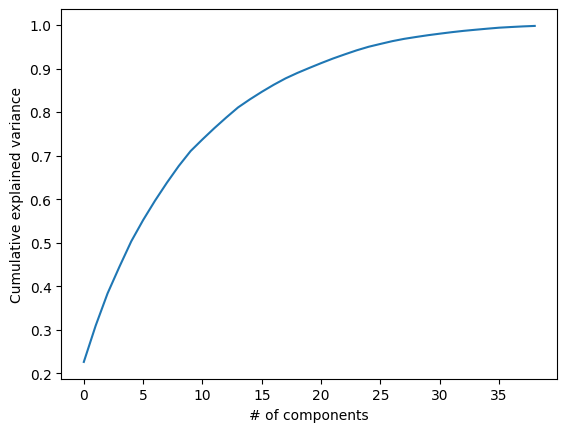

In [88]:
#Cumulative explained variance
from sklearn.decomposition import PCA
pca = PCA(39)
pca_full = pca.fit(X)

plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.xlabel('# of components')
plt.ylabel('Cumulative explained variance')

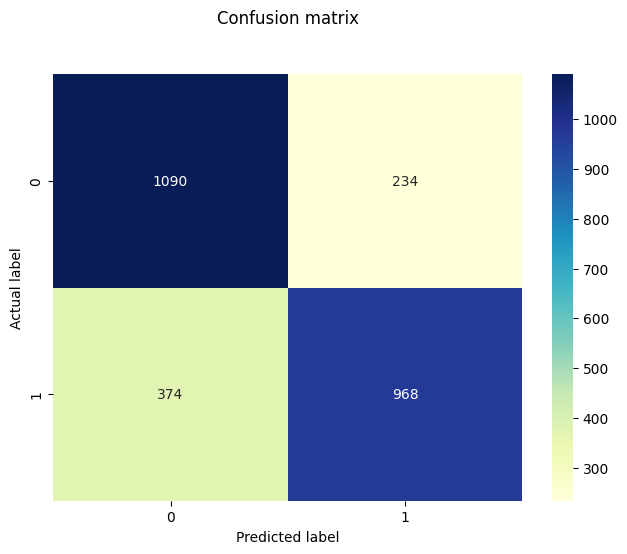

Accuracy: 0.7719429857464366
Precision: 0.8053244592346089
Recall: 0.7213114754098361
F1 score: 0.761006289308176
AUC : 0.772287157644495


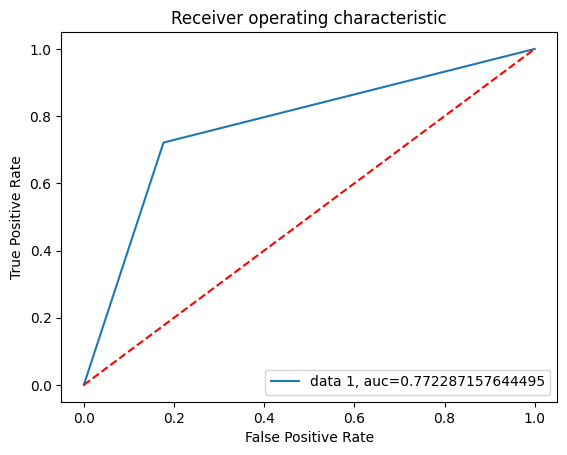

CPU times: user 1.78 s, sys: 1.13 s, total: 2.91 s
Wall time: 1.09 s


In [89]:
%%time
# 26 Principal Components seems good
pca = PCA(n_components=26)
X_transformed = pca.fit_transform(X_train)

X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(
    X_transformed, y_train, test_size=0.2, random_state=13)

lr5=LogisticRegression(C=0.4, random_state=4 ,penalty='l2', class_weight={0:1,1:1})
lr5.fit(X_train_pca, y_train_pca)

# predict
y_pred =lr5.predict(X_test_pca)

cf_matrix = confusion_matrix(y_test_pca, y_pred)
sns.heatmap(pd.DataFrame(cf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

print("Accuracy:",metrics.accuracy_score(y_test_pca, y_pred))
print("Precision:",metrics.precision_score(y_test_pca, y_pred))
print("Recall:",metrics.recall_score(y_test_pca, y_pred))
print("F1 score:",metrics.f1_score(y_test_pca, y_pred))
print("AUC :",metrics.roc_auc_score(y_test_pca, y_pred))

fpr, tpr, _ = metrics.roc_curve(y_test_pca,  y_pred)
auc = metrics.roc_auc_score(y_test_pca, y_pred)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.show()

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>8 | Feature Importance</div></b>      

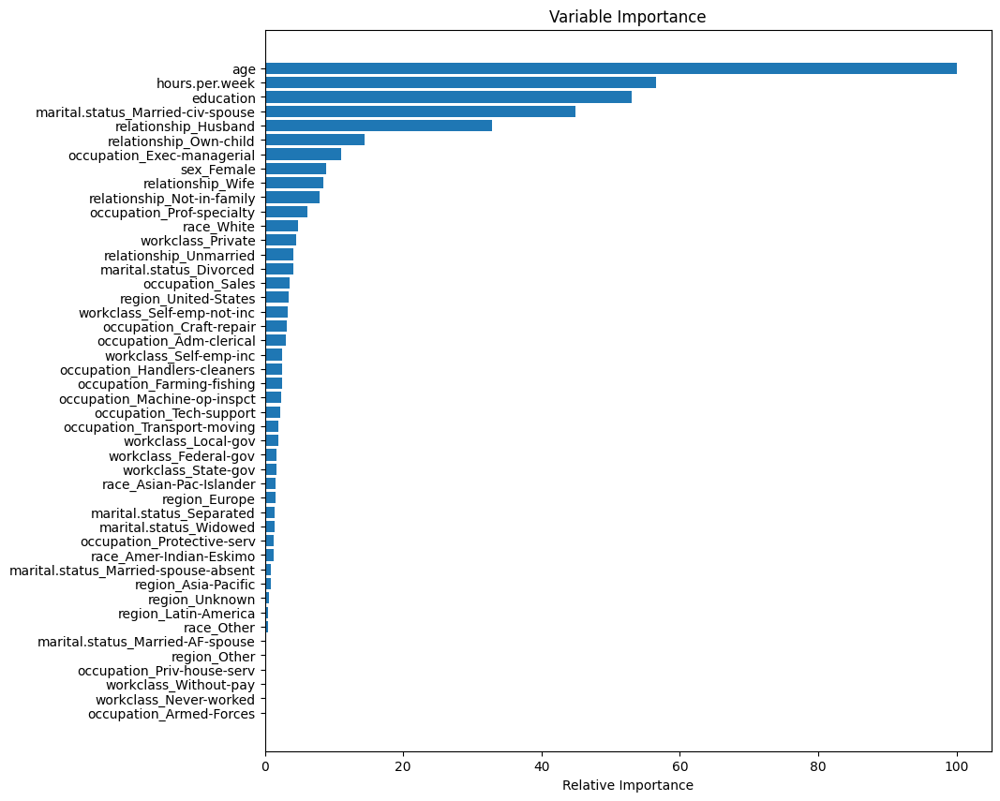

In [90]:
data1 = pd.DataFrame(X,y)

clf = ExtraTreesClassifier(n_estimators=250,
                              random_state=2)

clf.fit(X_train, y_train)


# Plot feature importance
feature_importance = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.figure(figsize=(10,10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, data1.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

In [91]:
data1.columns[sorted_idx][-30:]

Index(['race_Asian-Pac-Islander', 'workclass_State-gov',
       'workclass_Federal-gov', 'workclass_Local-gov',
       'occupation_Transport-moving', 'occupation_Tech-support',
       'occupation_Machine-op-inspct', 'occupation_Farming-fishing',
       'occupation_Handlers-cleaners', 'workclass_Self-emp-inc',
       'occupation_Adm-clerical', 'occupation_Craft-repair',
       'workclass_Self-emp-not-inc', 'region_United-States',
       'occupation_Sales', 'marital.status_Divorced', 'relationship_Unmarried',
       'workclass_Private', 'race_White', 'occupation_Prof-specialty',
       'relationship_Not-in-family', 'relationship_Wife', 'sex_Female',
       'occupation_Exec-managerial', 'relationship_Own-child',
       'relationship_Husband', 'marital.status_Married-civ-spouse',
       'education', 'hours.per.week', 'age'],
      dtype='object')

In [92]:
X_train_ef = X_train[data1.columns[sorted_idx][-30:]]

X_test_ef = X_test[data1.columns[sorted_idx][-30:]]

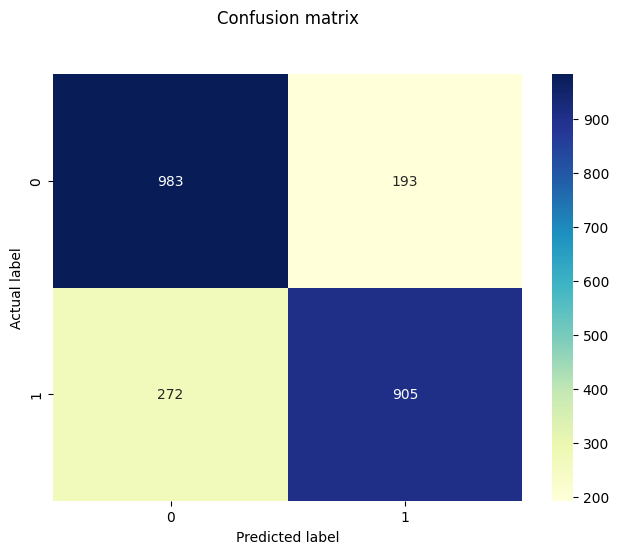

Accuracy: 0.8023799405014874
Precision: 0.8242258652094717
Recall: 0.7689039932030586
F1 score: 0.7956043956043956
AUC : 0.8023941734722776


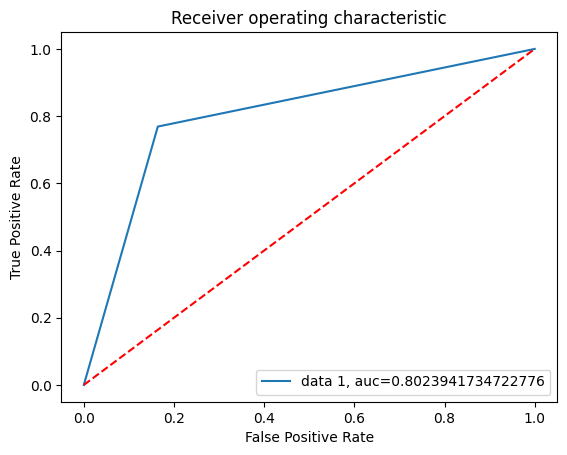

CPU times: user 1.57 s, sys: 910 ms, total: 2.48 s
Wall time: 846 ms


In [93]:
%%time
lr5=LogisticRegression(C=0.4, random_state=4 ,penalty='l2', class_weight={0:1,1:1})
lr5.fit(X_train_ef, y_train)

# predict
y_pred =lr5.predict(X_test_ef)

cf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(pd.DataFrame(cf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))
print("F1 score:",metrics.f1_score(y_test, y_pred))
print("AUC :",metrics.roc_auc_score(y_test, y_pred))

fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred)
auc = metrics.roc_auc_score(y_test, y_pred)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.show()

### <b><span style='color:#DEB078'>8.1 |</span><span style='color:#016CC9'> Grid Search </span></b> 

In [94]:
class GridSearch(object):

    def __init__(self,X_train,y_train,model,hyperparameters):

        self.X_train = X_train
        self.y_train = y_train
        self.model = model
        self.hyperparameters = hyperparameters

    def GridSearch(self):
        # Create randomized search 10-fold cross validation and 100 iterations
        cv = 10
        clf = GridSearchCV(self.model,
                                 self.hyperparameters,
                                 cv=cv,
                                 verbose=0,
                                 n_jobs=-1
                                 )
        # Fit randomized search
        best_model = clf.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model,best_model.best_params_

    def Best_Model_Predict(self,X_test):

        best_model,_ = self.GridSearch()
        pred = best_model.predict(X_test)
        return pred

### <b><span style='color:#DEB078'>8.2 |</span><span style='color:#016CC9'> Random Search </span></b> 

In [95]:
from scipy.stats import uniform

class RandomSearch(object):

    def __init__(self,X_train,y_train,model,hyperparameters):

        self.X_train = X_train
        self.y_train = y_train
        self.model = model
        self.hyperparameters = hyperparameters

    def RandomSearch(self):
        # Create randomized search 10-fold cross validation and 100 iterations
        cv = 10
        clf = RandomizedSearchCV(self.model,
                                 self.hyperparameters,
                                 random_state=1,
                                 n_iter=100,
                                 cv=cv,
                                 verbose=0,
                                 n_jobs=-1
                                 )
        # Fit randomized search
        best_model = clf.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model,best_model.best_params_

    def Best_Model_Predict(self,X_test):

        best_model,_ = self.RandomSearch()
        pred = best_model.predict(X_test)
        return pred

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>6 | SVM (Support Vector Machine)</div></b>      

**What is a Support Vector Machine**
A Support Vector Machine is a supervised machine learning algorithm which can be used for both classification and regression problems. It follows a technique called the kernel trick to transform the data and based on these transformations, it finds an optimal boundary between the possible outputs.

**How does it work?**
The main idea is to identify the optimal separating hyperplane which maximizes the margin of the training data.

The goal of SVMs is to find the optimal hyperplane because it not only classifies the existing dataset but also helps predict the class of the unseen data. And the optimal hyperplane is the one which has the biggest margin.

![Margin.png](https://github.com/PasanAbeysekara/group-43-dataset/assets/69195287/d558a83b-e54a-4e0b-b1cc-71a2e63d9c89)

In [96]:
y_train['income'].values

array([ True,  True, False, ..., False, False, False])

In [98]:
%%time
param_grid = [{'gamma': [ 0.1, 1, 10],'C': [ 0.10, 10, 100]}]

svm = SVC()

svm_GridSearch = GridSearch(X_train_f, y_train['income'].values, svm,param_grid )
y_pred = svm_GridSearch.Best_Model_Predict(X_test_f)


Best: 0.805612 using {'C': 10, 'gamma': 10}
CPU times: user 15.5 s, sys: 1.02 s, total: 16.5 s
Wall time: 6min 29s


**Kernel**

kernel parameters selects the type of hyperplane used to separate the data. Using ‘linear’ will use a linear hyperplane (a line in the case of 2D data). ‘rbf’ and ‘poly’ uses a non linear hyper-plane.

**gamma**

gamma is a parameter for non linear hyperplanes. The higher the gamma value it tries to exactly fit the training data set.  Increasing gamma leads to overfitting as the classifier tries to perfectly fit the training data.

**C**

C is the penalty parameter of the error term. It controls the trade off between smooth decision boundary and classifying the training points correctly.
A smaller C value leads to a wider street but more margin violations

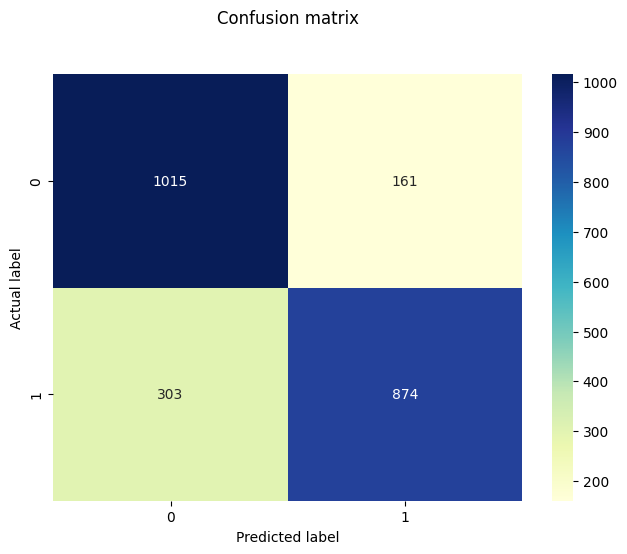

Accuracy: 0.8028049298767531
Precision: 0.8444444444444444
Recall: 0.7425658453695837
F1 score: 0.790235081374322
AUC : 0.802830541732411


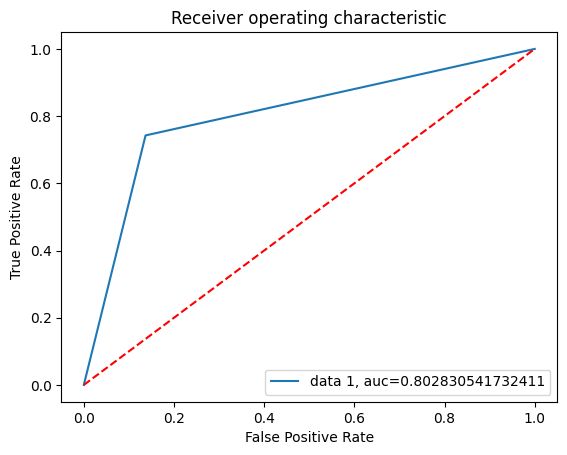

In [99]:
cf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(pd.DataFrame(cf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))
print("F1 score:",metrics.f1_score(y_test, y_pred))
print("AUC :",metrics.roc_auc_score(y_test, y_pred))

fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred)
auc = metrics.roc_auc_score(y_test, y_pred)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.show()

## <b><div style='padding:15px;background-color:#79A7D3;color:white;border-radius:2px;font-size:90%'>7 | Decision Tree</div></b>      

**Introduction to Decision Trees**

* A decision tree is a decision support tool that uses a tree-like graph or model of decisions and their possible consequences, including chance event outcomes, resource costs, and utility. It is one way to display an algorithm that only contains conditional control statements.

**How does Decision Tree works ?**

* Decision tree is a type of supervised learning algorithm (having a pre-defined target variable) that is mostly used in classification problems. It works for both categorical and continuous input and output variables. In this technique, we split the population or sample into two or more homogeneous sets (or sub-populations) based on most significant splitter / differentiator in input variables.

![asdwq.png](https://github.com/PasanAbeysekara/group-43-dataset/assets/69195287/4039b5bb-0e02-4641-8cc7-075ed8f59f1d)


In [102]:
%%time
from scipy.stats import randint
max_depth_value = [4, 5,6,7,8,9,10,11,12,13]
max_features_value =  randint(1, 7)
min_samples_leaf_value = randint(1, 4)
criterion_value = ["gini", "entropy"]

param_grid = dict(max_depth = max_depth_value,
                  max_features = max_features_value,
                  min_samples_leaf = min_samples_leaf_value,
                  criterion = criterion_value)

CART = DecisionTreeClassifier(random_state=1)

CART_RandSearch = RandomSearch(X_train_f, y_train, CART, param_grid)
Prediction_CART = CART_RandSearch.Best_Model_Predict(X_test_f)


Best: 0.797135 using {'criterion': 'entropy', 'max_depth': 8, 'max_features': 6, 'min_samples_leaf': 1}
CPU times: user 1.66 s, sys: 137 ms, total: 1.79 s
Wall time: 8.97 s


### Visualize Decision Tree

In [106]:
%pip install pydotplus

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.7/278.7 kB 4.9 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24552 sha256=c17d8835c64416a612e1fcef69cf850c18540989ff8fb89a1bbbe80b5626b2a5
  Stored in directory: /root/.cache/pip/wheels/69/b2/67/08f0eef649af92df772c09f451558298e07fab1bc7cdf33db0
Successfully built pydotplus
Note: you may need to restart the kernel to use updated packages.


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.669165 to fit



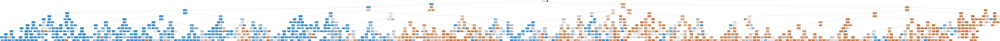

In [107]:
# Visualize Decision Tree
from sklearn import tree
from sklearn.tree import export_graphviz
from IPython.display import Image

feature_names = [i for i in X_train_f.columns]

y_train_str = y_train.astype('str')
y_train_str[y_train_str == 1] = "1"
y_train_str[y_train_str == 0] ="0"
y_train_str = y_train_str.values

model_1 = tree.DecisionTreeClassifier(criterion='gini', max_depth= 13, max_features= 2, min_samples_leaf= 2)
model_1.fit(X_train_f, y_train)

from six import StringIO
# Let's give dot_data some space so it will not feel nervous any more
dot_data = StringIO()
tree.export_graphviz(model_1, out_file=dot_data,filled=True)
import pydotplus

graph = pydotplus.graphviz.graph_from_dot_data(dot_data.getvalue())
# make sure you have graphviz installed and set in path
Image(graph.create_png())

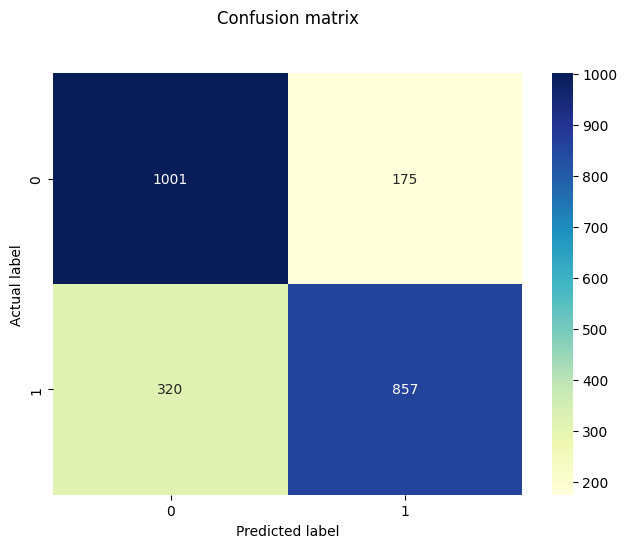

Accuracy: 0.7896302592435189
Precision: 0.8304263565891473
Recall: 0.7281223449447749
F1 score: 0.7759167043911274
AUC : 0.7896564105676255


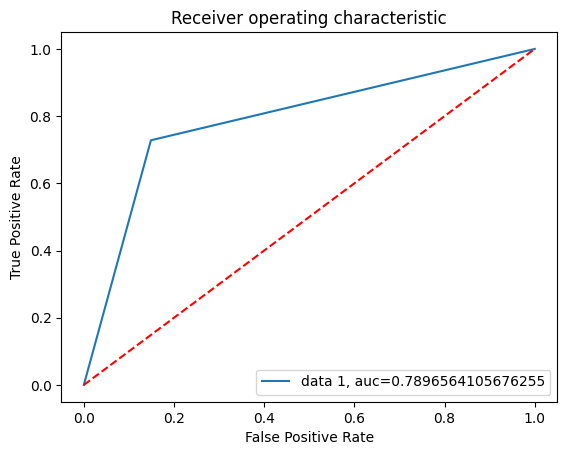

In [108]:
cf_matrix = confusion_matrix(y_test, Prediction_CART)
sns.heatmap(pd.DataFrame(cf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

print("Accuracy:",metrics.accuracy_score(y_test, Prediction_CART))
print("Precision:",metrics.precision_score(y_test, Prediction_CART))
print("Recall:",metrics.recall_score(y_test, Prediction_CART))
print("F1 score:",metrics.f1_score(y_test, Prediction_CART))
print("AUC :",metrics.roc_auc_score(y_test, Prediction_CART))

fpr, tpr, _ = metrics.roc_curve(y_test,  Prediction_CART)
auc = metrics.roc_auc_score(y_test, Prediction_CART)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.show()